In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# plotly express figures aren't showing. here is a fix:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/global-superstore/Global Superstore.txt


# Amir Daniali
 
This project is aimed to analyse a business sales data and review the store performance and gather features from the data. The initial data is stored in 50000+ lines of a text file. I want to demonstrate the executive decisions that would be possible to make if we had a better representation of the data. 

## If you want to see the visuals and skip to Part 3.
## If you want to know how the data cleaning and proccessing is done read Part 2 below. 



## Part 1- Importing the Database and Data Cleanup

After importing the dataset via pandas read_csv method, we can start cleaning the data.
- I made sure to unify the dataset column names to avoid capital letters and turn whitespace and - into _
- I then delete the useless 记录数 column to clean the dataframe. 
- I then convert the dates into datetime
- I then check to see if the database has any missing values by checking the info, which it doesn't
- Therefore I don't need to replace null values with default values.
- I then check if there are any duplicates in the dataframe, which there aren't any.

In [2]:
df = pd.read_csv("/kaggle/input/global-superstore/Global Superstore.txt", sep="	")
df.columns = df.columns.str.lower()
df.columns = df.columns.str.replace("-","_")
df.columns = df.columns.str.replace(" ","_")

df=df.drop('记录数',axis=1) # The Description of the database reads: ji_lu_shu: An unknown or unspecified column. - The column has no usefull information

df['order_date'] = pd.to_datetime(df['order_date'])
df['ship_date'] = pd.to_datetime(df['ship_date'])

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   category        51290 non-null  object        
 1   city            51290 non-null  object        
 2   country         51290 non-null  object        
 3   customer_id     51290 non-null  object        
 4   customer_name   51290 non-null  object        
 5   discount        51290 non-null  float64       
 6   market          51290 non-null  object        
 7   order_date      51290 non-null  datetime64[ns]
 8   order_id        51290 non-null  object        
 9   order_priority  51290 non-null  object        
 10  product_id      51290 non-null  object        
 11  product_name    51290 non-null  object        
 12  profit          51290 non-null  float64       
 13  quantity        51290 non-null  int64         
 14  region          51290 non-null  object        
 15  ro

26 columns and non of them are null. We learn that there are no missing values by looking at the non-null count in the info section. The most interesting columns seem to be:
- category
- market
- order_date
- product_name
- profit
- quantity
- sales
- state

In [4]:
pd.options.display.max_columns = None # We have too many columns that need to be printed
df.head() # kaggle will show the table in a nice display

,category,city,country,customer_id,customer_name,discount,market,order_date,order_id,order_priority,product_id,product_name,profit,quantity,region,row_id,sales,segment,ship_date,ship_mode,shipping_cost,state,sub_category,year,market2,weeknum
0,Office Supplies,Los Angeles,United States,LS-172304,Lycoris Saunders,0.0,US,2011-01-07,CA-2011-130813,High,OFF-PA-10002005,Xerox 225,9.3312,3,West,36624,19,Consumer,2011-01-09,Second Class,4.37,California,Paper,2011,North America,2
1,Office Supplies,Los Angeles,United States,MV-174854,Mark Van Huff,0.0,US,2011-01-21,CA-2011-148614,Medium,OFF-PA-10002893,"Wirebound Service Call Books, 5 1/2"" x 4""",9.2928,2,West,37033,19,Consumer,2011-01-26,Standard Class,0.94,California,Paper,2011,North America,4
2,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,2011-08-05,CA-2011-118962,Medium,OFF-PA-10000659,"Adams Phone Message Book, Professional, 400 Me...",9.8418,3,West,31468,21,Consumer,2011-08-09,Standard Class,1.81,California,Paper,2011,North America,32
3,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,2011-08-05,CA-2011-118962,Medium,OFF-PA-10001144,Xerox 1913,53.2608,2,West,31469,111,Consumer,2011-08-09,Standard Class,4.59,California,Paper,2011,North America,32
4,Office Supplies,Los Angeles,United States,AP-109154,Arthur Prichep,0.0,US,2011-09-29,CA-2011-146969,High,OFF-PA-10002105,Xerox 223,3.1104,1,West,32440,6,Consumer,2011-10-03,Standard Class,1.32,California,Paper,2011,North America,40


In [5]:
duplicate_series = df.duplicated()

print("First 10 duplicated rows:")
print(duplicate_series[duplicate_series == True].head(10))

print("\nDuplicate counts:")
print(duplicate_series.value_counts())

First 10 duplicated rows:
Series([], dtype: bool)

Duplicate counts:
False    51290
Name: count, dtype: int64


There are no duplicate rows in the dataset.

## Part 2- Understanding the Data 
In order to understand the data better we use multiple buildin pandas modules like describe() and value_counts().


In [6]:
df[['sales','discount','profit','quantity', 'shipping_cost']].describe()

,sales,discount,profit,quantity,shipping_cost
count,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000
mean,246.498440,0.142908,28.610982,3.476545,26.375818
std,487.567175,0.212280,174.340972,2.278766,57.296810
min,0.000000,0.000000,-6599.978000,1.000000,0.002000
25%,31.000000,0.000000,0.000000,2.000000,2.610000
50%,85.000000,0.000000,9.240000,3.000000,7.790000
75%,251.000000,0.200000,36.810000,5.000000,24.450000
max,22638.000000,0.850000,8399.976000,14.000000,933.570000


We try to describe a few numerical columns that seem important.
- A few important questions come to mind after seeing the data described
  - How do we have rows with a sales amount of 0?
  - How do we have rows with 0 or -6599.978 amount of profit? How can profit be negative? Is this error or normal?
    - Seems like its very important to know how many items were sold with zero or negative profits. Perhaps grouped by the store location to determine store profitibility? Or maybe to diagnose the cause later on.
  - How are each stores or markets fairing based on their sales figuers? Which items have the highest profit?
  - Seems like the global superstore is not selling anything beside furniture, office supplies, and technologies. How can they make such massive losses like -6599 in profit if they arent selling risky materials like food? 

In [7]:
print(df['country'].value_counts(),"\n") # Mostly US. Followed by Australia, France, Mexico, ...
print(df['category'].value_counts(),"\n") # Office Supplies, Technology, Furniture
print(df['city'].value_counts(),"\n") # New York City, Los Angeles, Philadelphia, ...
print(df['market'].value_counts(),"\n") # Global Market Abbr, will expand later
print(df['product_id'].value_counts(),"\n") # Highest product ID sold is OFF-AR-10003651 = Newell 350 (Some kind of Art)
print(df['ship_mode'].value_counts(),"\n") # Standard Class, Second Class, First Class, Same Day
print(df['sub_category'].value_counts(),"\n") # Lots of categories
print(df['weeknum'].value_counts().head(10),"\n") # Gives us the weeks with the highest sales.

country
United States    9994
Australia        2837
France           2827
Mexico           2644
Germany          2065
                 ... 
South Sudan         2
Chad                2
Swaziland           2
Eritrea             2
Bahrain             2
Name: count, Length: 147, dtype: int64 

category
Office Supplies    31273
Technology         10141
Furniture           9876
Name: count, dtype: int64 

city
New York City            915
Los Angeles              747
Philadelphia             537
San Francisco            510
Santo Domingo            443
                        ... 
Hadera                     1
Morley                     1
Villeneuve-la-Garenne      1
Torremolinos               1
Redwood City               1
Name: count, Length: 3636, dtype: int64 

market
APAC      11002
LATAM     10294
EU        10000
US         9994
EMEA       5029
Africa     4587
Canada      384
Name: count, dtype: int64 

product_id
OFF-AR-10003651     35
OFF-AR-10003829     31
OFF-BI-10002799     30
OFF-

Week 47, 46, 45 seem to be the most popular weeks for shoppers. Great insight for potential sales and staff management.

In [8]:
df["pocessing_time"] = (df["ship_date"] - df["order_date"]) # difference between customer orders and us shipping
df["pocessing_time"] = df["pocessing_time"].apply(lambda x: x.days) 

df['pocessing_time'].value_counts()

pocessing_time
4    14434
5    11221
2     7026
6     6255
3     5035
7     3057
0     2600
1     1662
Name: count, dtype: int64

In [9]:
df["market_expanded"] = df["market"].replace({
    "APAC": "Asia Pacific",
    "LATAM": "Latin America",
    "EU": "Europe",
    "US": "United States",
    "EMEA": "Middle East" # Europe, Middle East, Africa
})

df["month"] = pd.to_datetime(df['order_date']).dt.month_name()

df['gross_margin'] = df['profit'] / df['sales'] * 100 # gross margin is profit divided by total sale times 100

df.head()

,category,city,country,customer_id,customer_name,discount,market,order_date,order_id,order_priority,product_id,product_name,profit,quantity,region,row_id,sales,segment,ship_date,ship_mode,shipping_cost,state,sub_category,year,market2,weeknum,pocessing_time,market_expanded,month,gross_margin
0,Office Supplies,Los Angeles,United States,LS-172304,Lycoris Saunders,0.0,US,2011-01-07,CA-2011-130813,High,OFF-PA-10002005,Xerox 225,9.3312,3,West,36624,19,Consumer,2011-01-09,Second Class,4.37,California,Paper,2011,North America,2,2,United States,January,49.111579
1,Office Supplies,Los Angeles,United States,MV-174854,Mark Van Huff,0.0,US,2011-01-21,CA-2011-148614,Medium,OFF-PA-10002893,"Wirebound Service Call Books, 5 1/2"" x 4""",9.2928,2,West,37033,19,Consumer,2011-01-26,Standard Class,0.94,California,Paper,2011,North America,4,5,United States,January,48.909474
2,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,2011-08-05,CA-2011-118962,Medium,OFF-PA-10000659,"Adams Phone Message Book, Professional, 400 Me...",9.8418,3,West,31468,21,Consumer,2011-08-09,Standard Class,1.81,California,Paper,2011,North America,32,4,United States,August,46.865714
3,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,2011-08-05,CA-2011-118962,Medium,OFF-PA-10001144,Xerox 1913,53.2608,2,West,31469,111,Consumer,2011-08-09,Standard Class,4.59,California,Paper,2011,North America,32,4,United States,August,47.982703
4,Office Supplies,Los Angeles,United States,AP-109154,Arthur Prichep,0.0,US,2011-09-29,CA-2011-146969,High,OFF-PA-10002105,Xerox 223,3.1104,1,West,32440,6,Consumer,2011-10-03,Standard Class,1.32,California,Paper,2011,North America,40,4,United States,September,51.840000


In [10]:
def discount_labeling(row):

    if row['discount'] == 0:
        discount_label = 'none'
        
    elif row['discount'] < 0.10:
        discount_label = 'low'

    elif row['discount'] < 0.30:
        discount_label = 'medium'

    elif row['discount'] < 0.60:
        discount_label = 'high'

    else:
        discount_label = 'extreme'

    
    return discount_label
        
        

df['discount_bucket'] = df.apply(discount_labeling, axis=1)

print(df['discount_bucket'].value_counts()) # mostly no discount 

# Filter the negative profit rows, finding their relationships to discounts
negative_profits = df[df['profit'] < 0]

print("\nDiscount Bucket for sales with negtive profits")
print(negative_profits['discount_bucket'].value_counts()) 
# mostly high+extreme discounts. maybe its the fact that at the end of the season we have to give high discount to clear
# the store?


discount_bucket
none       29009
medium     10969
high        6551
extreme     4150
low          611
Name: count, dtype: int64

Discount Bucket for sales with negtive profits
discount_bucket
high       5710
extreme    4150
medium     2641
low          43
Name: count, dtype: int64


## Part 3- Data Aggregating and Visualization
Now that we have all the data we need its time to aggregate data and start visualizing. I have chosen the following data visualisations:
- Category Distribution
- Products overview based on category
- Top/Bottom 10 states by total profit
- Category Gross Margin
- Customer Lifetime Value (CLV) - Total profit each customer has generated across all orders
- visualizing Cindy Steward - the least profitable customer 
- total sales of all subcategories
- Sales in each market for each country
- Sales of each category in each market
- Cumulative sales of each category based on time
- Sales based on week number
- Shipments mode based on sub-category
- Sales for state and city
- Sales per week and staffing needs per week

     sub_category                                      product_name  sales
27    Accessories                                Belkin Router, USB  23473
190   Accessories                         Memorex Router, Erganomic  21887
25    Accessories                          Belkin Router, Erganomic  19889
192   Accessories                               Memorex Router, USB  19607
189   Accessories                         Memorex Router, Bluetooth  17318
...           ...                                               ...    ...
3742       Tables           Hon Conference Table, Adjustable Height  15018
3641       Tables        Barricks Conference Table, Fully Assembled  14930
3667       Tables           Bevis Conference Table, Fully Assembled  14885
3709       Tables    Chromcraft Computer Table, with Bottom Storage  13828
3713       Tables  Chromcraft Conference Table, with Bottom Storage  13701

[85 rows x 3 columns]


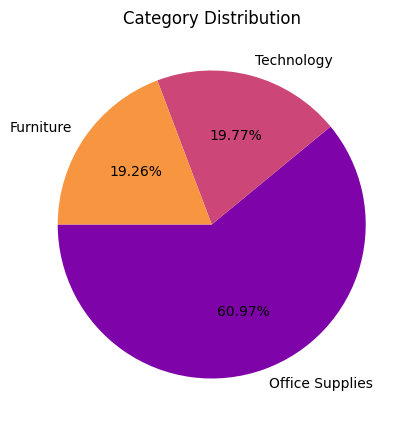

In [11]:
# Products overview based on subcategory 
product_sales = df.groupby(['sub_category', 'product_name'])['sales'].sum().reset_index()

top_5_products_per_subcategory = (
    product_sales
    .sort_values(['sub_category', 'sales'], ascending=[True, False])
    .groupby('sub_category')
    .head(5)
)

print(top_5_products_per_subcategory)

category_counts = df['category'].value_counts()

plt.figure(figsize=(5, 5))
plt.pie(
    category_counts,
    labels=category_counts.index,
    autopct='%1.2f%%',
    startangle=180,
    colors=sns.color_palette('plasma', len(category_counts))
)
plt.title('Category Distribution')
plt.show()

# turns out most of our sales are office supplies. 

fig = px.treemap(
    product_sales,
    path=['sub_category', 'product_name'],
    values='sales',
    title='Treemap of Product Sales Grouped by Subcategory',
    color='sales',
    color_continuous_scale='Plasma',
    hover_data={'sales': ':.2f'}
)

fig.show()

# We can browse differnet categories and visit their different products sold.

In [12]:
# Products overview based on category
fig = px.sunburst(df,
                  path=['category','sub_category', 'product_name'],
                  values='sales',
                  hover_data ='sales'   )
fig.update_layout(height=600,title_text='Products overview based on category')
fig.show()
# Click on each button to see categories underneath. It looks oddly like the google chrome logo.

In [13]:
# Top/Bottom 10 states by total profit
top_10_states = df.groupby('state')['profit'].sum().nlargest(10)
bottom_10_states = df.groupby('state')['profit'].sum().nsmallest(10)

print('Top States Profits\n')
print(top_10_states)
print('\n\nBottom States Profits\n')
print(bottom_10_states) # why do we keep stores in states with negative profits?

Top States Profits

state
England                   99907.73100
California                76381.38710
New York                  74038.54860
Ile-de-France             44055.92400
New South Wales           43695.98400
North Rhine-Westphalia    42347.87100
San Salvador              35883.37700
Washington                33402.65170
Michigan                  24463.18760
São Paulo                 21878.02388
Name: profit, dtype: float64


Bottom States Profits

state
Istanbul            -29033.70000
Lagos               -25922.51100
Texas               -25729.35630
Ohio                -16971.37660
Izmir               -15729.80400
Pennsylvania        -15559.96030
Francisco Morazán   -15007.41608
Panama              -14978.49936
Punjab              -14665.05000
Stockholm           -13806.44100
Name: profit, dtype: float64


       customer_name      profit
0       Tamara Chand  8672.89890
1       Raymond Buch  8453.04950
2       Sanjit Chand  8205.37990
3       Hunter Lopez  7816.56778
4        Bill Eplett  7410.00530
..               ...         ...
790     Skye Norling -2637.98050
791  Candace McMahon -2798.79060
792   Grant Thornton -3577.92306
793      Luke Foster -3644.34750
794    Cindy Stewart -6151.55810

[795 rows x 2 columns]


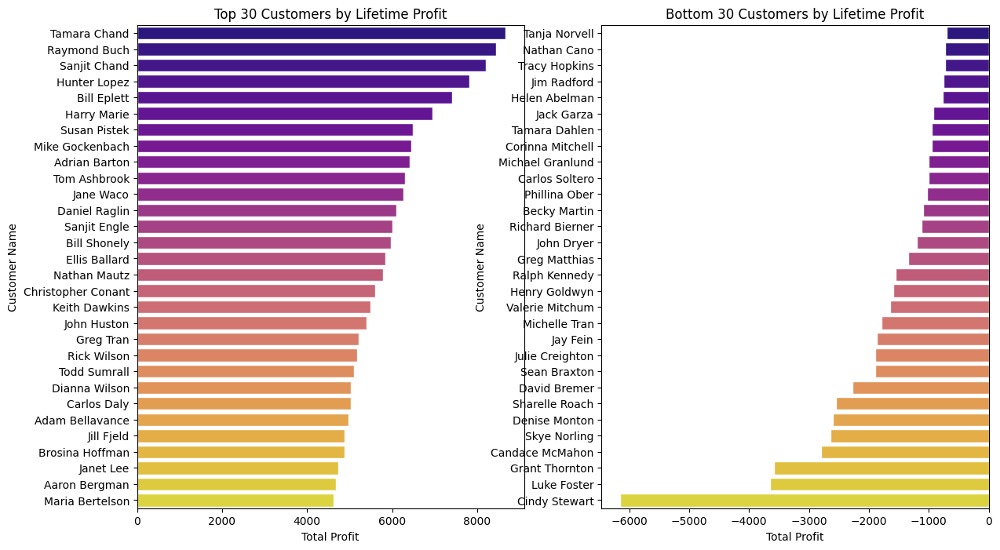

In [14]:
customer_lifetime_value = (
    df.groupby('customer_name')['profit']
    .sum()
    .sort_values(ascending=False)
    .reset_index()
)

print(customer_lifetime_value)

top_30 = customer_lifetime_value.head(30)
bottom_30 = customer_lifetime_value.tail(30)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 8)) # I want to show these side by side so we needd subplots.
sns.set(style="whitegrid")

sns.barplot(
    data=top_30,
    y='customer_name',
    x='profit',
    palette='plasma',
    ax=axs[0]
)
axs[0].set_title('Top 30 Customers by Lifetime Profit')
axs[0].set_xlabel('Total Profit')
axs[0].set_ylabel('Customer Name')

sns.barplot(
    data=bottom_30,
    y='customer_name',
    x='profit',
    palette='plasma',
    ax=axs[1]
)
axs[1].set_title('Bottom 30 Customers by Lifetime Profit')
axs[1].set_xlabel('Total Profit')
axs[1].set_ylabel('Customer Name')

plt.show()


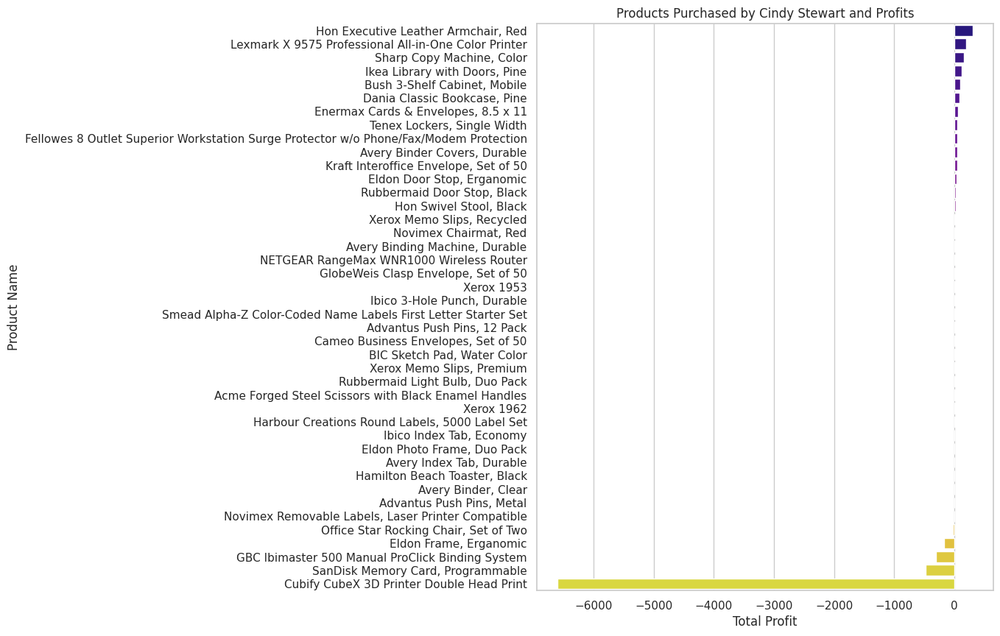

In [15]:
# Cindy Stewart is the most unprofitable customer found.
# We should find who Cindy Stewart is and how she was able to make so much money just buying stuff from this company. 
# Leading to us losing so much money. Sadly we cannot send a private investigator after her so we should do the next
# best thing.


cindy_data = df[df['customer_name'] == 'Cindy Stewart']

# Find the list of all products she bought and the profit of all of those.
product_profits = (
    cindy_data.groupby('product_name')['profit']
    .sum()
    .reset_index()
    .sort_values('profit', ascending=False)
)

plt.figure(figsize=(8, 10))
sns.barplot(
    data=product_profits,
    x='profit',
    y='product_name',
    palette='plasma'
)

plt.title("Products Purchased by Cindy Stewart and Profits")
plt.xlabel("Total Profit")
plt.ylabel("Product Name")
plt.show()

# turns out it we should stop selling the cubify CubeX and sandisk memory products and we would be so much less unprofitable. 

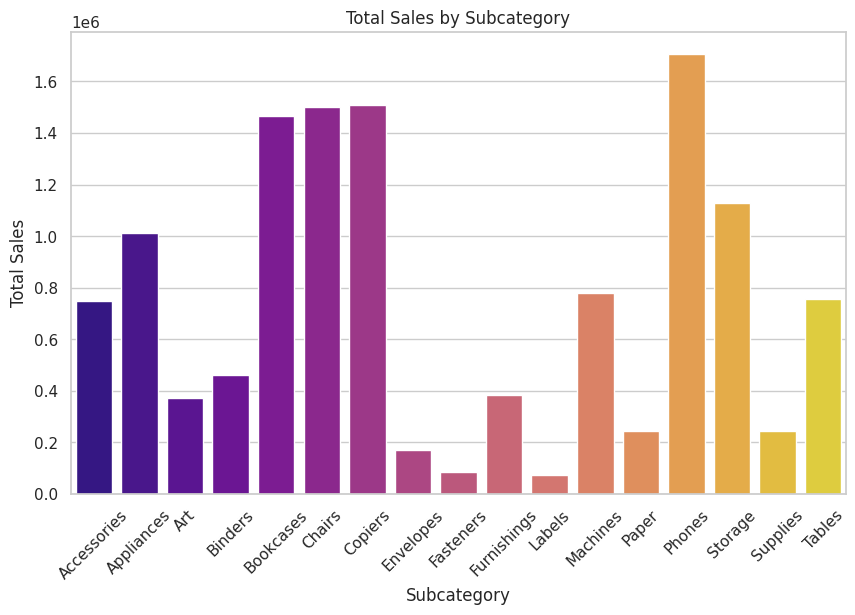

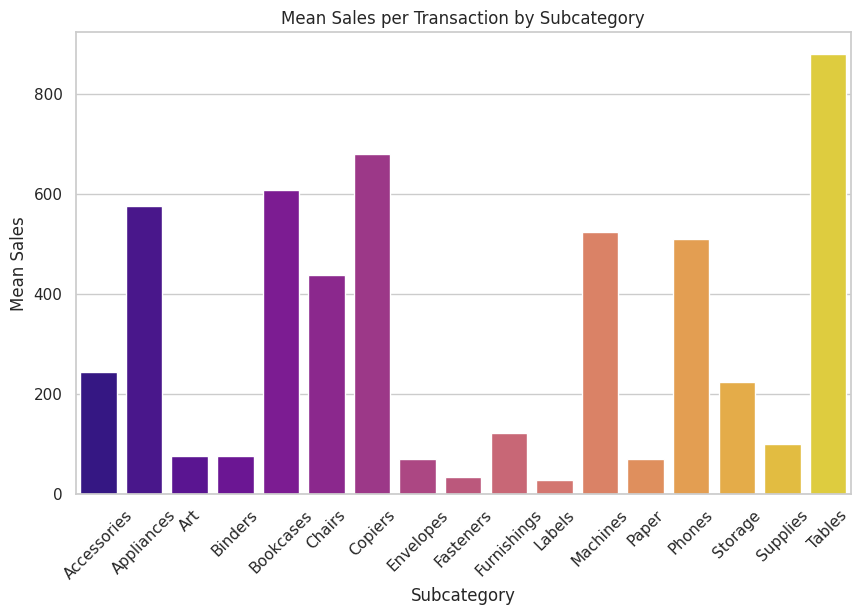

In [16]:
# Total sales of all subcategories
subcategory_sales = df.groupby('sub_category')['sales'].agg(['sum', 'mean']).reset_index()
# mean = total sales for subcategory / number of rows (transactions) in that subcategory
# sum = total sale for subcategory


plt.figure(figsize=(10, 6))
sns.barplot(
    data=subcategory_sales,
    x='sub_category',
    y='sum',
    palette='plasma'
)
plt.title('Total Sales by Subcategory')
plt.xlabel('Subcategory')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.show()


plt.figure(figsize=(10, 6))
sns.barplot(
    data=subcategory_sales,
    x='sub_category',
    y='mean',
    palette='plasma'
)
plt.title('Mean Sales per Transaction by Subcategory')
plt.xlabel('Subcategory')
plt.ylabel('Mean Sales')
plt.xticks(rotation=45)
plt.show()

# turns out we are selling way too many tables. probably because the price is way too cheap and unprofitable for us 
# (and profitable for customers) as we are going to find out later. 

In [17]:
# Sales in each market for each country
sales_by_market_country = (
    df.groupby(['market_expanded', 'country'])['sales']
    .sum()
    .reset_index()
    .sort_values(['market_expanded', 'sales'], ascending=[True, False])
)


print(sales_by_market_country)


markets = sales_by_market_country['market_expanded'].unique()

figs = []
for market in markets:
    market_data = sales_by_market_country[sales_by_market_country['market_expanded'] == market]
    fig = px.bar(
        market_data,
        x='country',
        y='sales',
        title=f'Sales by Country in {market} Market',
        labels={'sales': 'Total Sales', 'country': 'Country'},
        color='country'
    )
    fig.show()
    figs.append(fig)


    market_expanded                           country    sales
35           Africa                      South Africa    95301
8            Africa  Democratic Republic of the Congo    87415
25           Africa                           Morocco    87079
10           Africa                             Egypt    84137
29           Africa                           Nigeria    54347
..              ...                               ...      ...
112     Middle East                           Bahrain      669
141     Middle East                        Tajikistan      242
129     Middle East                         Macedonia      210
109     Middle East                           Armenia      156
148   United States                     United States  2297354

[149 rows x 3 columns]


In [18]:
# Category Gross Margin and Sales and profit of sub categories

sales_profit_by_category_market = (
    df.groupby(['category', 'market_expanded'])[['sales', 'profit']]
    .sum()
    .reset_index()
)

# melting lets us plot different columns in the same figure
melted_main = sales_profit_by_category_market.melt(
    id_vars=['category', 'market_expanded'],
    value_vars=['sales', 'profit'],
    var_name='Metric',
    value_name='Value'
)


fig_main = px.bar(
    melted_main,
    x='category',
    y='Value',
    color='Metric',
    barmode='group',
    facet_col='market_expanded',
    title='Total Sales and Profit by Category Across Markets',
    labels={'Value': 'Amount', 'category': ' '} # we don't need to rewrite category so many times 
)

for i in range(len(fig_main.layout.annotations)):
    fig_main.layout.annotations[i].text = fig_main.layout.annotations[i].text.split('=')[-1] # Just the name of the market not the market_expanded part

fig_main.show()


sales_profit_by_category_market['gross_margin'] = sales_profit_by_category_market['profit'] / sales_profit_by_category_market['sales']

# gross margin to based on category/market
fig_margin = px.bar(
    sales_profit_by_category_market,
    x='category',
    y='gross_margin',
    facet_col='market_expanded',
    color='category',
    title='Gross Margin by Category Across Markets',
    labels={'gross_margin': 'Gross Margin', 'category': ' '}
)

for i in range(len(fig_margin.layout.annotations)):
    fig_margin.layout.annotations[i].text = fig_margin.layout.annotations[i].text.split('=')[-1] # Just the name of the market not the market_expanded part

fig_margin.show()

# Seems like asians like to buy alot of furniture and technology but not office supplies. Since the profit margin of 
# office supplies in asia is decent it is advised to increase presence there and find ways to increase sales.

# Based on the data it seems canada is a particularly profitable market so my advise is to increase presense there too.

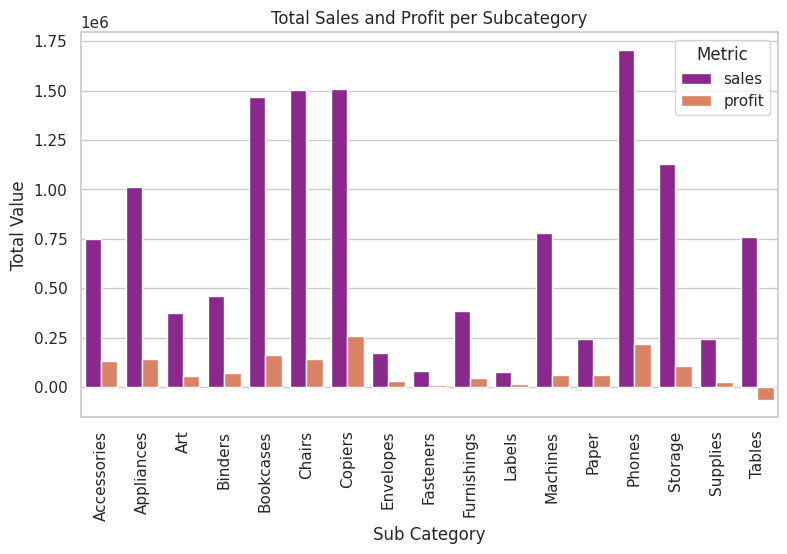

In [19]:
grouped_sum = df.groupby('sub_category')[['profit', 'sales']].sum().reset_index()
grouped_sum['gross_margin'] = grouped_sum['profit'] / grouped_sum['sales']

# melting lets us plot different columns in the same figure
sum_melted_main = grouped_sum.melt(
    id_vars='sub_category',
    value_vars=['sales', 'profit'],
    var_name='Metric',
    value_name='Value'
)


plt.figure(figsize=(9, 5))
sns.barplot(
    data=sum_melted_main,
    x='sub_category',
    y='Value',
    hue='Metric',
    palette='plasma'
)
plt.title('Total Sales and Profit per Subcategory')
plt.ylabel('Total Value')
plt.xlabel('Sub Category')
plt.xticks(rotation=90)
plt.legend(title='Metric')
plt.show()

# As seen here, tables are way too unprofitable. We have to stop selling them so cheap. It is losing us money!

In [20]:
# Cumulative Sales
 
df_sorted = df.sort_values(['category', 'order_date'])

df_sorted['cumulative_sales'] = df_sorted.groupby('category')['sales'].cumsum()

fig = px.line(
    df_sorted,
    x='order_date',
    y='cumulative_sales',
    color='category',
    title='Cumulative Sales Over Time by Category',
    labels={'order_date': 'Order Date', 'cumulative_sales': 'Cumulative Sales'}
)

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Cumulative Sales',
    legend_title='Category'
)

fig.show()
# Dynamic figures are so cool. 
# Seems like the rate of sales is increasing the most for technology which is nice. 

In [21]:
# Cumulative Profits
 
df_sorted['cumulative_pofits'] = df_sorted.groupby('category')['profit'].cumsum()

fig = px.line(
    df_sorted,
    x='order_date',
    y='cumulative_pofits',
    color='category',
    title='Cumulative Profits Over Time by Category',
    labels={'order_date': 'Order Date', 'cumulative_pofits': 'Cumulative Profits'}
)

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Cumulative Profits',
    legend_title='Category'
)

fig.show()
# Dynamic figures are so cool. 
# Seems like the technology is the most profitable almost all the time. 

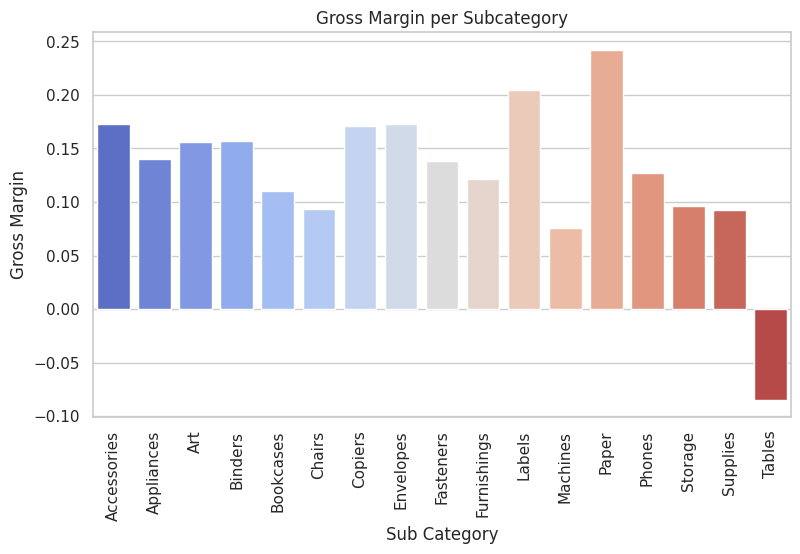

In [22]:
# Sub category gross margin = profit of a sub category divided by total sales in a category
plt.figure(figsize=(9, 5))
sns.barplot(
    data=grouped_sum,
    x='sub_category',
    y='gross_margin',
    palette='coolwarm'
)
plt.title('Gross Margin per Subcategory')
plt.ylabel('Gross Margin')
plt.xlabel('Sub Category')
plt.xticks(rotation=90)
plt.show()


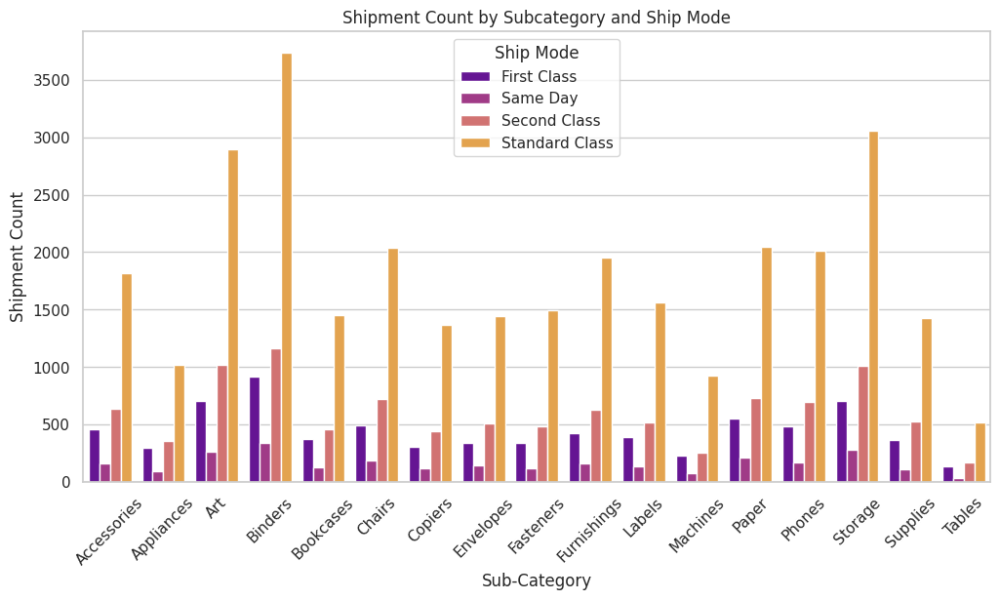

In [23]:
shipment_counts = (
    df.groupby(['sub_category', 'ship_mode'])[['order_id']]
    .count()
    .rename(columns={'order_id': 'shipment_count'})
    .reset_index()
)

plt.figure(figsize=(12, 6))
sns.barplot(
    data=shipment_counts,
    x='sub_category',
    y='shipment_count',
    hue='ship_mode',
    palette='plasma'
)

plt.title('Shipment Count by Subcategory and Ship Mode')
plt.xlabel('Sub-Category')
plt.ylabel('Shipment Count')
plt.xticks(rotation=45)
plt.legend(title='Ship Mode')
plt.show()

# Art is getting a lot of first class and same day deliveries. Is it because it is often a gift? 
# How can we use this information to prepare better for deliveries?

# Also binders are the most numerous subcategory to receive first class shipment.. why? 

In [24]:
# sales per state and city
city_state_sales = df[['state','city','sales']].groupby(['state','city'])['sales'].sum().reset_index()
fig = px.treemap(city_state_sales,path=['state','city'], values='sales')
fig.update_layout(height=700,title='Sales per State and City')
fig.show()
# England as a whole is the biggest state for sales, followed by california. And the chart clearly shows
# london earning less than Los Angeles. Really good way of showcasing the distribution. 

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



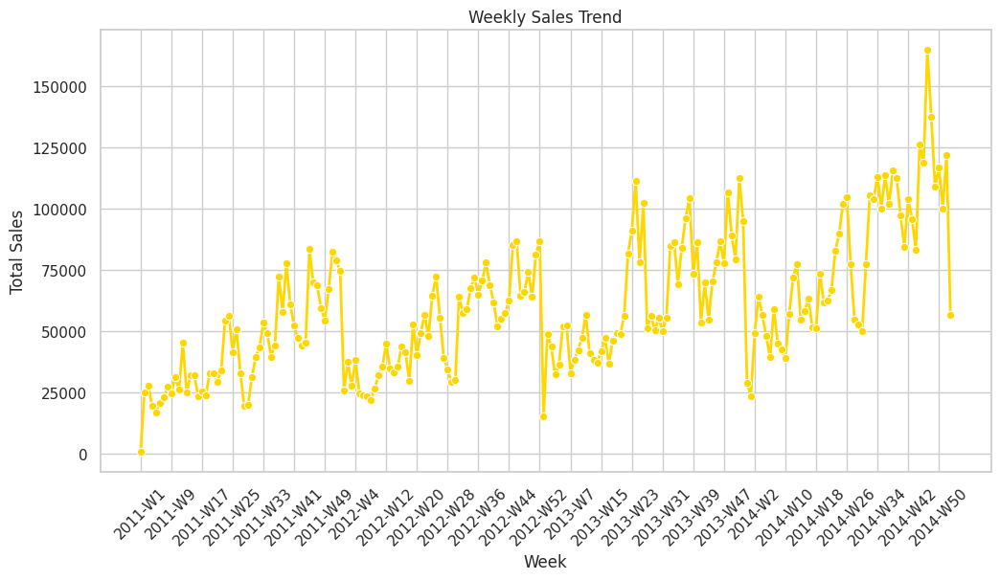

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



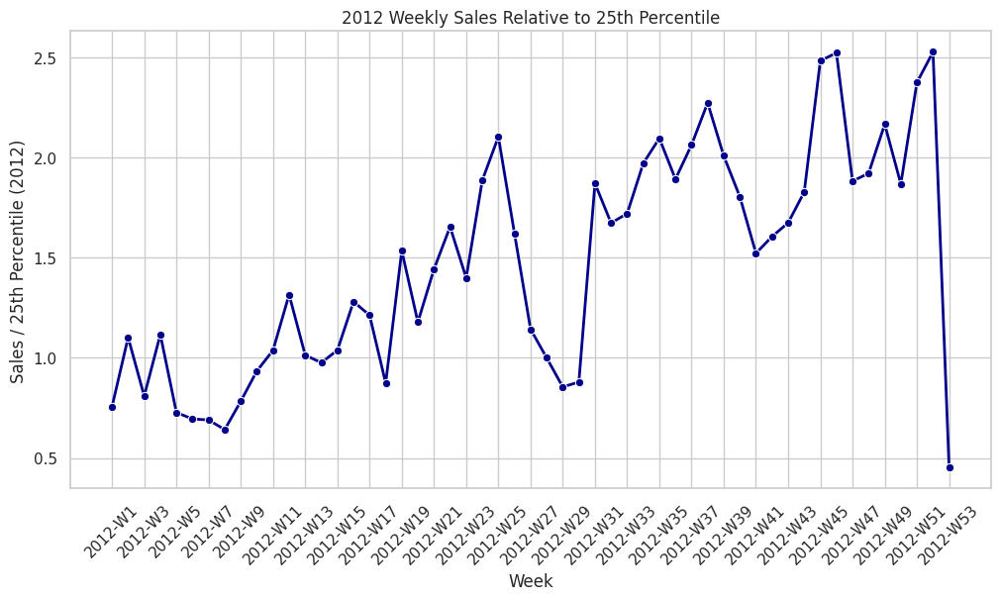

In [25]:
# Analyzing staff needs over the course of the year. 

weekly_sales = df.groupby(['year', 'weeknum'])['sales'].sum().reset_index()
weekly_sales['week_label'] = weekly_sales['year'].astype(str) + '-W' + weekly_sales['weeknum'].astype(str)


plt.figure(figsize=(12, 6))
sns.lineplot(
    data=weekly_sales,
    x='week_label',
    y='sales',
    marker='o',
    linewidth=2,
    color='gold'
)
plt.xticks(ticks=range(0, len(weekly_sales), 8), labels=weekly_sales['week_label'][::8], rotation=45)
plt.title('Weekly Sales Trend')
plt.xlabel('Week')
plt.ylabel('Total Sales')
plt.show()

sales_2012 = weekly_sales[weekly_sales['year'] == 2012].copy()

percentile_25_2012 = sales_2012['sales'].quantile(0.25)

sales_2012['sales_vs_25th'] = sales_2012['sales'] / percentile_25_2012

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=sales_2012,
    x='week_label',
    y='sales_vs_25th',
    marker='o',
    linewidth=2,
    color='darkblue'
)
plt.xticks(ticks=range(0, len(sales_2012), 2), labels=sales_2012['week_label'][::2], rotation=45)
plt.title('2012 Weekly Sales Relative to 25th Percentile')
plt.xlabel('Week')
plt.ylabel('Sales / 25th Percentile (2012)')
plt.show()





As the trend shows the final two months of every year have the highest sales. We could determine staffing arrangements using the historical chart

Assuming our need for staff increases linearly past a certain point with the number of sales, and assuming that point is the sales figures is the

25 percentile of sales, we can find how many staff we need for each week and coordinate our hiring and staffing agendas. 

For example for 2012 we find that whatever the baseline of our store is, we need to scale our staff to 2x that by June (Week 24) and then by August

we get back to the baseline. Ramping up again around September until the end of year. 

## Part 4- Conclusions
By utilizing pandas, python and plotting libraries like matplotlib, seaborn and plotly we learned.
- High discounts correlate with more unprofitable sales.
- Technology category leads in profitability, while Furniture often shows lower margins.
- United States dominates in total sales, canada is the best market for expansion.
- Many many states are overall unprofitable. we should really address this. maybe close the worst branches.
- Standard shipping class is the most used shipping.
- Subcategories like Copiers and Phones are consistently profitable, making them strategic focus areas.
- We should stop selling tables or agressively increase prices.
- Some items like CubeX are unprofitable. We should address these items.